PHASE 3:FEATURE ENGINEERING

 Extract Time-Based Features

In [2]:
import pandas as pd
import numpy as np
df = pd.read_csv("crime_data_sampled.csv", parse_dates=["Date"])
print(df.head())
print(df.columns)


                 Date  Year  Month  Day  Hour  DayOfWeek  Season Primary Type  \
0 2001-08-16 22:12:50  2001      8   16    22          3  Summer        ARSON   
1 2001-05-15 23:20:00  2001      5   15    23          1  Spring        ARSON   
2 2001-08-02 03:13:23  2001      8    2     3          3  Summer        ARSON   
3 2001-07-08 22:30:00  2001      7    8    22          6  Summer        ARSON   
4 2001-05-30 01:35:00  2001      5   30     1          2  Spring        ARSON   

   District  Community Area  Ward   Latitude  Longitude  Arrest  Domestic  
0         2              44     8  41.809535 -87.613797   False     False  
1         2              76    35  41.798543 -87.604986   False     False  
2         2              71    21  41.827293 -87.622257    True     False  
3         2              46    10  41.802529 -87.591939   False      True  
4         2              76    11  41.803592 -87.612686   False     False  
Index(['Date', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek

In [3]:
# Extract time-based features
df["Year"] = df["Date"].dt.year
df["Month"] = df["Date"].dt.month
df["Day"] = df["Date"].dt.day
df["Hour"] = df["Date"].dt.hour
df["Weekday"] = df["Date"].dt.weekday  # 0 = Monday, 6 = Sunday
df["WeekOfYear"] = df["Date"].dt.isocalendar().week

# Cyclical encoding for Month & Hour
df["Month_sin"] = np.sin(2 * np.pi * df["Month"] / 12)
df["Month_cos"] = np.cos(2 * np.pi * df["Month"] / 12)

df["Hour_sin"] = np.sin(2 * np.pi * df["Hour"] / 24)
df["Hour_cos"] = np.cos(2 * np.pi * df["Hour"] / 24)

print("✅ Time-based features added & saved!")
df.head()

✅ Time-based features added & saved!


,Date,Year,Month,Day,Hour,DayOfWeek,Season,Primary Type,District,Community Area,...,Latitude,Longitude,Arrest,Domestic,Weekday,WeekOfYear,Month_sin,Month_cos,Hour_sin,Hour_cos
0,2001-08-16 22:12:50,2001,8,16,22,3,Summer,ARSON,2,44,...,41.809535,-87.613797,False,False,3,33,-0.866025,-0.500000,-0.500000,0.866025
1,2001-05-15 23:20:00,2001,5,15,23,1,Spring,ARSON,2,76,...,41.798543,-87.604986,False,False,1,20,0.500000,-0.866025,-0.258819,0.965926
2,2001-08-02 03:13:23,2001,8,2,3,3,Summer,ARSON,2,71,...,41.827293,-87.622257,True,False,3,31,-0.866025,-0.500000,0.707107,0.707107
3,2001-07-08 22:30:00,2001,7,8,22,6,Summer,ARSON,2,46,...,41.802529,-87.591939,False,True,6,27,-0.500000,-0.866025,-0.500000,0.866025
4,2001-05-30 01:35:00,2001,5,30,1,2,Spring,ARSON,2,76,...,41.803592,-87.612686,False,False,2,22,0.500000,-0.866025,0.258819,0.965926


In [4]:
df.columns

Index(['Date', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek', 'Season',
       'Primary Type', 'District', 'Community Area', 'Ward', 'Latitude',
       'Longitude', 'Arrest', 'Domestic', 'Weekday', 'WeekOfYear', 'Month_sin',
       'Month_cos', 'Hour_sin', 'Hour_cos'],
      dtype='object')

Create Lag Features

In [5]:
# Convert Date column to datetime
df["Date"] = pd.to_datetime(df["Date"])

# Set Date as index
df = df.set_index("Date")
df = df.sort_index()  # Sorts the Date index in ascending order

# Compute Crime Count Features
df["Crime_Count_7D"] = df["Primary Type"].rolling("7D").count().shift(1)
df["Crime_Count_30D"] = df["Primary Type"].rolling("30D").count().shift(1)
df["Crime_Count_90D"] = df["Primary Type"].rolling("90D").count().shift(1)
df["Crime_MA_7D"] = df["Crime_Count_7D"].rolling(7).mean().shift(1)

# Compute Moving Averages Using Crime Counts
df["Crime_MA_7D"] = df["Crime_Count_7D"].rolling("7D").mean()
df["Crime_MA_30D"] = df["Crime_Count_30D"].rolling("30D").mean()

# Compute Difference-Based Features
df["Crime_Diff_7D_30D"] = df["Crime_Count_7D"] - df["Crime_Count_30D"]
df["Crime_Diff_30D_90D"] = df["Crime_Count_30D"] - df["Crime_Count_90D"]


In [6]:
df.columns

Index(['Year', 'Month', 'Day', 'Hour', 'DayOfWeek', 'Season', 'Primary Type',
       'District', 'Community Area', 'Ward', 'Latitude', 'Longitude', 'Arrest',
       'Domestic', 'Weekday', 'WeekOfYear', 'Month_sin', 'Month_cos',
       'Hour_sin', 'Hour_cos', 'Crime_Count_7D', 'Crime_Count_30D',
       'Crime_Count_90D', 'Crime_MA_7D', 'Crime_MA_30D', 'Crime_Diff_7D_30D',
       'Crime_Diff_30D_90D'],
      dtype='object')

Haversine Matrix

In [7]:
import pandas as pd
import numpy as np
from haversine import haversine, Unit

# Define district coordinates
district_labels = {
    "Downtown": (41.881832, -87.623177),
    "Lincoln Park": (41.921438, -87.651304),
    "Hyde Park": (41.794295, -87.590701),
    "Loop": (41.883581, -87.627843),
    "River North": (41.890251, -87.635438),
    "South Loop": (41.867576, -87.623334),
    "West Loop": (41.882457, -87.644404),
    "Lakeview": (41.940379, -87.653180),
    "Wicker Park": (41.908803, -87.679562),
    "Logan Square": (41.923084, -87.699458),
    "Pilsen": (41.854068, -87.656972),
    "Chinatown": (41.850730, -87.634930),
    "Bronzeville": (41.821957, -87.617942),
    "Englewood": (41.775370, -87.641697),
    "Austin": (41.894682, -87.763500),
    "Garfield Park": (41.881667, -87.717847),
    "Little Village": (41.845587, -87.724856),
    "Avondale": (41.941606, -87.711456),
    "Uptown": (41.968417, -87.654047),
    "Rogers Park": (42.009439, -87.669563)
}

# Create distance matrix
district_names = list(district_labels.keys())
n = len(district_names)
distance_matrix = np.zeros((n, n))

for i in range(n):
    for j in range(n):
        if i != j:
            distance_matrix[i, j] = haversine(district_labels[district_names[i]],
                                              district_labels[district_names[j]],
                                              unit=Unit.KILOMETERS)

# Convert to DataFrame
distance_df = pd.DataFrame(distance_matrix, index=district_names, columns=district_names)
print(distance_df)


                 Downtown  Lincoln Park  Hyde Park       Loop  River North  \
Downtown         0.000000      4.981363  10.098667   0.432476     1.380790   
Lincoln Park     4.981363      0.000000  15.002154   4.635728     3.708088   
Hyde Park       10.098667     15.002154   0.000000  10.394039    11.295106   
Loop             0.432476      4.635728  10.394039   0.000000     0.972299   
River North      1.380790      3.708088  11.295106   0.972299     0.000000   
South Loop       1.585250      6.421066   8.585342   1.818412     2.713192   
West Loop        1.758692      4.371951  10.765477   1.376700     1.141043   
Lakeview         6.967485      2.111856  17.047823   6.654565     5.764068   
Wicker Park      5.547516      2.727818  14.706889   5.117626     4.194266   
Logan Square     7.803556      3.988219  16.917676   7.377098     6.434086   
Pilsen           4.166773      7.505892   8.621505   4.072753     4.400756   
Chinatown        3.592721      7.978367   7.267154   3.699709   

Clustering using kmeans

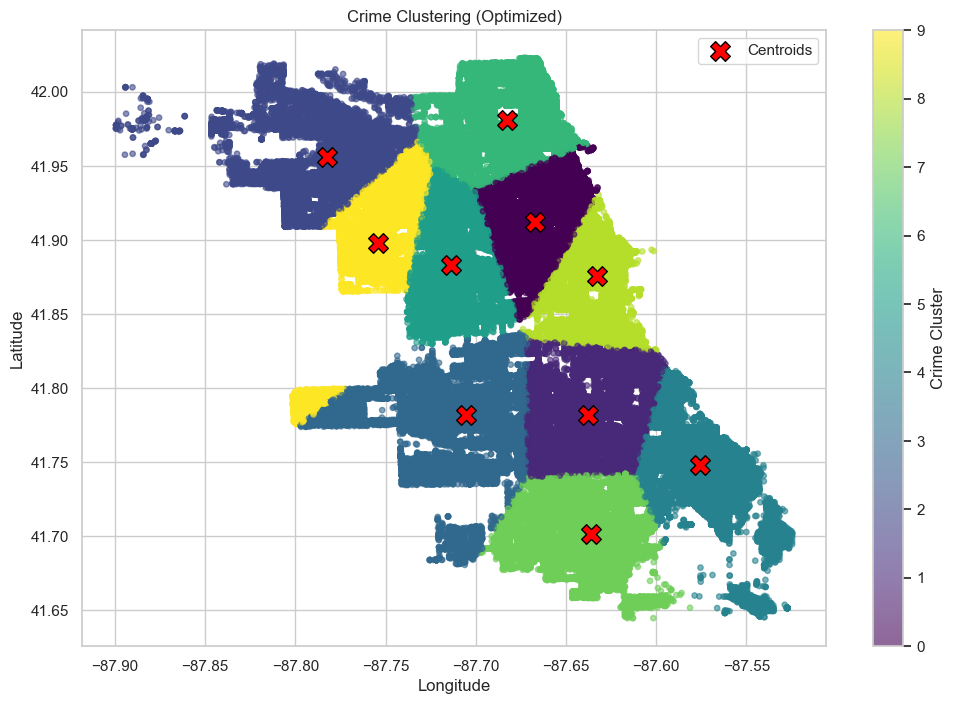

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import StandardScaler


# District labels with coordinates
district_labels = {
    "Downtown": (41.881832, -87.623177),
    "Lincoln Park": (41.921438, -87.651304),
    "Hyde Park": (41.794295, -87.590701),
    "Loop": (41.883581, -87.627843),
    "River North": (41.890251, -87.635438),
    "South Loop": (41.867576, -87.623334),
    "West Loop": (41.882457, -87.644404),
    "Lakeview": (41.940379, -87.653180),
    "Wicker Park": (41.908803, -87.679562),
    "Logan Square": (41.923084, -87.699458),
    "Pilsen": (41.854068, -87.656972),
    "Chinatown": (41.850730, -87.634930),
    "Bronzeville": (41.821957, -87.617942),
    "Englewood": (41.775370, -87.641697),
    "Austin": (41.894682, -87.763500),
    "Garfield Park": (41.881667, -87.717847),
    "Little Village": (41.845587, -87.724856),
    "Avondale": (41.941606, -87.711456),
    "Uptown": (41.968417, -87.654047),
    "Rogers Park": (42.009439, -87.669563),
    "Edgewater": (41.984312, -87.659865),
    "West Ridge": (41.998046, -87.703798),
    "Humboldt Park": (41.900758, -87.702482),
    "Albany Park": (41.968011, -87.721291),
    "Near North Side": (41.900961, -87.629053),
    "Near West Side": (41.882668, -87.663818),
    "Near South Side": (41.856530, -87.620588),
    "Douglas": (41.834796, -87.617232),
    "Woodlawn": (41.780384, -87.593744),
    "Washington Park": (41.791321, -87.617785),
    "South Shore": (41.760592, -87.564778)
}
# Haversine function
def haversine(lat1, lon1, lat2, lon2):
    from math import radians, cos, sin, asin, sqrt
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * asin(sqrt(a))
    return 6371 * c  # Distance in km

# Load and clean data
df = df.dropna(subset=["Latitude", "Longitude"])
df["Latitude"] = pd.to_numeric(df["Latitude"], errors="coerce")
df["Longitude"] = pd.to_numeric(df["Longitude"], errors="coerce")

# Select lat-long features
location_features = df[["Latitude", "Longitude"]].values

# Normalize lat-long (not using pairwise distances to save memory)
scaler = StandardScaler()
location_features_scaled = scaler.fit_transform(location_features)

# Efficient clustering for large datasets
num_clusters = 10
kmeans = MiniBatchKMeans(n_clusters=num_clusters, random_state=42, batch_size=1024, n_init=10)
df["Crime_Cluster"] = kmeans.fit_predict(location_features_scaled)

# Convert scaled centroids back to real lat-long values
centroids = scaler.inverse_transform(kmeans.cluster_centers_)

# Plot settings
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

# Scatter plot for clusters
scatter = plt.scatter(df["Longitude"], df["Latitude"], c=df["Crime_Cluster"], cmap="viridis", alpha=0.6, s=15)

# Add cluster centroids
plt.scatter(centroids[:, 1], centroids[:, 0], marker='X', s=200, c='red', label="Centroids", edgecolors='black')

# Plot labels
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Crime Clustering (Optimized)")
plt.colorbar(scatter, label="Crime Cluster")
plt.legend()
plt.show()


In [9]:
import pandas as pd

# Assuming df contains both Crime_Cluster and Primary Type
# Group by cluster and count crime types
cluster_crime_distribution = df.groupby(['Crime_Cluster', 'Primary Type']).size().unstack(fill_value=0)

# Display distribution
print("\n🔍 Crime Distribution per Cluster:")
print(cluster_crime_distribution)



🔍 Crime Distribution per Cluster:
Primary Type   ARSON  ASSAULT  BATTERY  BURGLARY  \
Crime_Cluster                                      
0                196      917     2663      1404   
1                360     3098     9031      2188   
2                148      605     1578       729   
3                179     1514     4148      1640   
4                218     2130     5562      1751   
5                337     2319     7104      1497   
6                329     1202     3470      1224   
7                244     1659     4305      1259   
8                205     1322     3465       729   
9                241     1476     4534      1073   

Primary Type   CONCEALED CARRY LICENSE VIOLATION  CRIM SEXUAL ASSAULT  \
Crime_Cluster                                                           
0                                             41                  167   
1                                             87                  302   
2                                             30

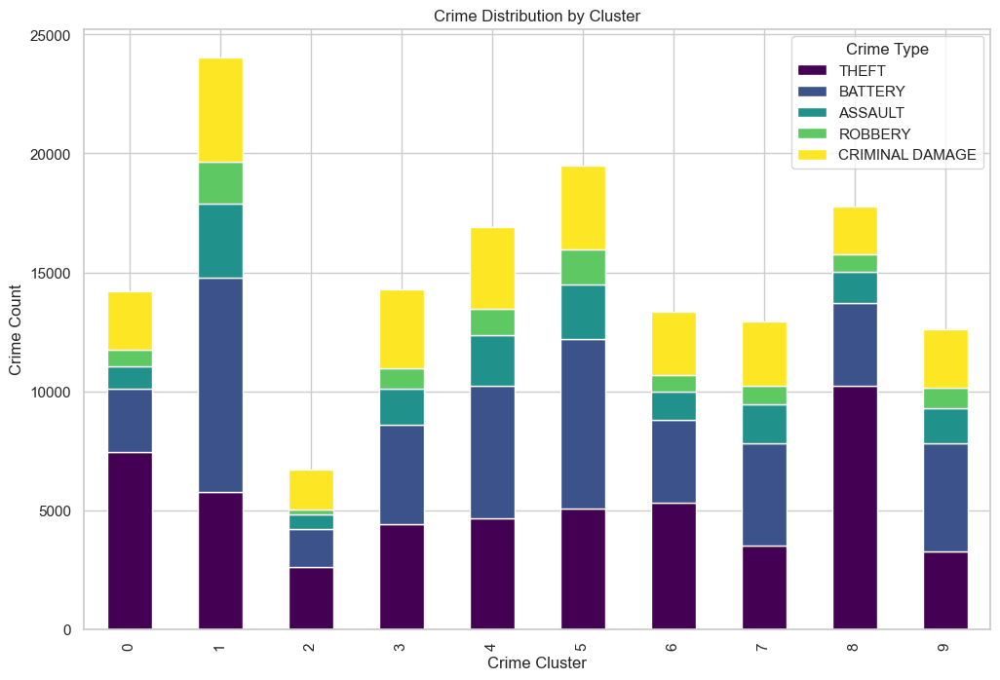

In [14]:
import matplotlib.pyplot as plt

# Select top 5 crime types by cluster
top_crimes = ['THEFT', 'BATTERY', 'ASSAULT', 'ROBBERY', 'CRIMINAL DAMAGE']

# Aggregate data
crime_cluster_summary = cluster_crime_distribution[top_crimes]

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
crime_cluster_summary.plot(kind='bar', stacked=True, colormap='viridis', ax=ax)

plt.title("Crime Distribution by Cluster")
plt.xlabel("Crime Cluster")
plt.ylabel("Crime Count")
plt.legend(title="Crime Type")
plt.show()


In [17]:
import folium
import pandas as pd
from folium.plugins import MarkerCluster

# 🟢 Sample 10,000 rows for faster rendering (adjust as needed)
df_sample = df.sample(n=10000, random_state=42)

# 🔥 Cluster severity labels
cluster_labels = {
    0: "Property Crime Zone",
    1: "Violent Crime Zone",
    2: "Low-Crime Residential",
    3: "Mixed Crime Zone",
    4: "Dangerous Zone",
    5: "Red-Light District",
    6: "Sex Crime Zone",
    7: "Low-Crime Area",
    8: "Theft Hotspot",
    9: "Underground Crime Zone"
}

# 🎨 Colors for each cluster
cluster_colors = {
    0: "blue",
    1: "red",
    2: "green",
    3: "purple",
    4: "orange",
    5: "pink",
    6: "brown",
    7: "cyan",
    8: "yellow",
    9: "black"
}

# 🌍 Initialize folium map centered at Chicago
m = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# 🚀 Use MarkerCluster for better performance
marker_cluster = MarkerCluster().add_to(m)

# 🔥 Plot crime locations with cluster colors
for row in df_sample.itertuples(index=False):
    cluster = row.Crime_Cluster
    folium.CircleMarker(
        location=(row.Latitude, row.Longitude),
        radius=3,
        color=cluster_colors[cluster],
        fill=True,
        fill_color=cluster_colors[cluster],
        fill_opacity=0.7,
        popup=f"Cluster: {cluster}\n{cluster_labels[cluster]}"
    ).add_to(marker_cluster)

# 🟡 Add centroids
for cluster_id, (lat, lon) in enumerate(centroids):
    folium.Marker(
        location=[lat, lon],
        icon=folium.Icon(color='red', icon='info-sign'),
        popup=f"Centroid: {cluster_id}"
    ).add_to(m)

# 💾 Save the map to an HTML file
m.save("crime_clusters_map.html")
print("✅ Map saved as 'crime_clusters_map.html'")

# Display the map in Jupyter Notebook
m


✅ Map saved as 'crime_clusters_map.html'


Clustering using DBSCAN

In [10]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.cluster import DBSCAN

# ✅ **Reduce Dataset Size for Faster Computation**
df_sample = df.sample(frac=0.2, random_state=42)  # Adjust fraction if needed

# ✅ **Convert Coordinates to Radians (DBSCAN requires this for Haversine)**
coords = np.radians(df_sample[["Latitude", "Longitude"]].values)

# ✅ **Apply DBSCAN with Haversine Metric (No Need for Precomputed Distance Matrix)**
eps_km = 0.525/ 6371  # Convert 1.5 km to radians (Earth's radius = 6371 km)
dbscan = DBSCAN(eps=eps_km, min_samples=45, metric="haversine")
df_sample["Crime_Cluster"] = dbscan.fit_predict(coords)

# ✅ **Remove Noise (-1)**
df_filtered = df_sample[df_sample["Crime_Cluster"] != -1]

# ✅ **Plot Using Mapbox**
fig = px.scatter_mapbox(
    df_filtered,
    lat="Latitude",
    lon="Longitude",
    color=df_filtered["Crime_Cluster"].astype(str),
    color_discrete_sequence=px.colors.qualitative.Bold,
    zoom=10,
    title="Crime Hotspots with Optimized Haversine DBSCAN",
)

# ✅ **Improve Map Aesthetics**
fig.update_layout(
    mapbox_style="carto-positron",
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    title_x=0.5,
)

fig.show()


Anomaly Detection using LSTM

In [11]:
df = df.reset_index()
df.columns

Index(['Date', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek', 'Season',
       'Primary Type', 'District', 'Community Area', 'Ward', 'Latitude',
       'Longitude', 'Arrest', 'Domestic', 'Weekday', 'WeekOfYear', 'Month_sin',
       'Month_cos', 'Hour_sin', 'Hour_cos', 'Crime_Count_7D',
       'Crime_Count_30D', 'Crime_Count_90D', 'Crime_MA_7D', 'Crime_MA_30D',
       'Crime_Diff_7D_30D', 'Crime_Diff_30D_90D', 'Crime_Cluster'],
      dtype='object')

In [12]:
df.shape

(272264, 29)

In [13]:
df.to_csv("crime_data_engineered.csv", index=False)
